---
##### Disclaimer
Certain trade names or company products are mentioned in the text to specify adequately the procedure and equipment used. In no case does such identification imply
recommendation or endorsement by the National Institute of Standards and Technology, nor does it
imply that the equipment is the best available for the purpose.

---

# Using Bokeh at NIST

Over the last couple years, researchers in the Fire Research Division at the National Institute of Standards and Technology (NIST) have used Python/Anaconda tools on a wide range of projects. Only recently have we started using Bokeh. Two projects that use Bokeh are described in this post: the first uses Bokeh to create an interactive map of NIST fire studies and the second uses Bokeh to plot thermal data from a firefighter's immediate environment in real time.

---
## Interactive Map of NIST Fire Studies
Fire research at the National Institute of Standards and Technology (NIST) dates back to the early 1900's following the need for a standardized fire hydrant coupling after the Great Baltimore Fire. Fast-forward to the 1980s and for the last 30 years, NIST researchers have been performing experiments and running computer simulations following fire incidents to advance the field of fire safety.

NIST researchers wrote detailed reports of their work following these fires, but an intuitive, centralized source of this material did not exist. Therefore, we wanted to build an interface to fix this. We felt a map that showed where the fires occured with interactivity to link to the reports would be an interesting project.


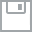
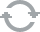
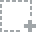
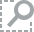
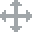
...
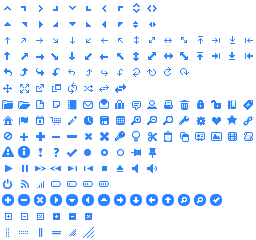
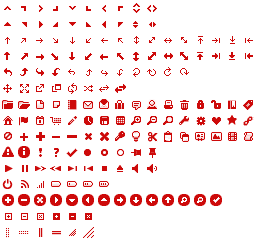
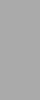
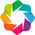
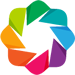

In [2]:
import pandas as pd
from bokeh.models.glyphs import Circle
from bokeh.plotting import show, output_notebook,figure
from bokeh.models import (
    GMapPlot, GMapOptions, Range1d, ColumnDataSource, LinearAxis,
    PanTool, WheelZoomTool,HoverTool, TapTool, OpenURL)
output_notebook()

### First, let's load and take a look at the data file of fires.

In [3]:
data = pd.read_csv('study_data.csv')
data.head()

,Study,Latitude,Longitude,Color,Type,Date,Report
0,Simulation of an Attic Fire in a Wood Frame Re...,41.802088,-87.681981,Navy,LODD/LODI,2-Nov-12,http://dx.doi.org/10.6028/NIST.TN.1838
1,Simulation of a Fire in a Hillside Residential...,37.739505,-122.439223,Navy,LODD/LODI,2-Jun-11,http://dx.doi.org/10.6028/NIST.TN.1856
2,Simulation of a Residential Wind Driven Baseme...,38.965891,-76.917754,Navy,LODD/LODI,24-Feb-12,http://dx.doi.org/10.6028/NIST.TN.1870
3,Simulation of the Dynamics of a Wind-Driven Fi...,29.679490,-95.282329,Navy,LODD/LODI,12-Apr-09,http://www.nist.gov/customcf/get_pdf.cfm?pub_i...
4,Simulation of the Dynamics of a Fire in a Two-...,40.404689,-91.382416,Red,LODD/LODI & Civilian Loss,22-Dec-99,http://www.nist.gov/customcf/get_pdf.cfm?pub_i...


The addresses of the fires were geocoded using GoogleV3 geocoder to generate the lattitude and longitude for each fire. The studies were then coded into one of four categories: LODD/LODI (a fire with a firefighter Line of Duty Death or Line of Duty Injury), Civilian Loss, WUI (wildland urban interface fire), or LODD/LODI and Civilian Loss. The data file also includes the NIST hosting link of the report so that we can link to it through first class Bokeh features.

### The next step is to load in a simple map.
The latitude, longitude, and zoom are set to view all of the United States and Puerto Rico.

In [4]:
x_range = Range1d()
y_range = Range1d()

map_options = GMapOptions(lat=39., lng=-98, zoom=3)

plot = GMapPlot(
    x_range=x_range, y_range=y_range,
    map_options=map_options,
    title = "NIST Fire Studies", plot_width=875, plot_height=500
)
plot.map_options.map_type="terrain"

### Adding Interaction
We wanted the study name, type, and date of the fire to be available upon hover. Second, we wanted the glyphs to be clickable to direct users to the full study reports (the main purpose of this exercise).

In [15]:
source = ColumnDataSource({'lat':data['Latitude'],'lon':data['Longitude'],'studys': data['Study'],
                           'report': data['Report'],'fill':data['Color'],'type':data['Type'],'date':data['Date']})
circle = Circle(x="lon",y="lat",size=15,fill_color="fill")
plot.add_glyph(source, circle)

pan = PanTool()
wheel_zoom = WheelZoomTool()
hover = HoverTool()
hover.tooltips = [('Study Title','@studys'),('Date','@date'),('Type','@type')]
tap = TapTool()
url = "@report"
TapTool.callback = OpenURL(url=url)

plot.add_tools(pan,wheel_zoom,hover,tap)

In [16]:
show(plot)

This is clearly a simple example, but that is the point. The final product is an interative map that clearly highlights where fires have been studied by NIST researchers, with minimal coding overhead.

---
## Real-Time Data Plotting of a Firefighter's Thermal Exposure

Bokeh was also utilized by our group at NIST to improve an existing project [[1]](#References) focused on characterizing a firefighter's thermal exposure in fire scenarios. 

To overcome challenges associated with measuring a firefighter's continuously changing environment, a portable measurement and data acquisition system was designed to be used with firefighter personal protective equipment (PPE). The system needed to:

- measure the temperature and heat flux (heat rate per area) of a firefighter's immediate environment

- store and circulate cooling water around the heat flux sensor

- withstand the typical movements and actions of firefighters and the elevated thermal conditions encountered in a fire environment

- accompany a firefighter as he/she moves throughout the environment to conduct various tasks 

### Description of Portable Measurement and Data Acquisition System

The portable system can be divided into two main parts: the helmet and the pack.

#### Helmet Portion

The helmet portion of the system consists of a type K thermocouple and a Schmidt-Boelter heat flux gauge (SBG) to measure temperature and heat flux, respectively. Both sensors are mounted to the aluminum shield on the front of a firefighter helmet. 

<img width="500" src="media/helmet.png">

Two sections of 1/8” diameter rubber tubing connected to the SBG are used to transport the cooling water around the gauge. The rubber tubing and sensor wires travel out the backside of the helmet and to a hydration backpack.

#### Pack Portion

The data logger rests in the front pocket of the pack, the water reservoir used to store the cooling water for the SBG is located in the rear pocket of the pack, and the water pump used to circulate the cooling water is located in a side pocket of the pack.

<img width="600" src="media/pack.png">

The low-profile hydration pack is worn under a PPE coat on the chest of the firefighter to avoid interference with the Self-Contained Breathing Apparatus worn on the firefighter’s back. Because the hydration pack is worn underneath the PPE coat, its components are protected from the intense thermal conditions encountered in fire environments. 

<img width="300" src="media/FF_with_pack.png">

### New Data Logger with WiFi Support

Recently, we decided to replace the original data logger with a microcontroller that supports a Linux distribution and WiFi. Using Python with the microcontroller data logger expands the capabilities of the portable measurement and data acquisition system and allows the logged data to be plotted in real time. The workflows to collect, store, and plot the sensor data using the original data logger and using the new microcontroller data logger are presented and discussed below.
<img width="500" src="media/original_workflow.png">
<img width="500" src="media/new_workflow.png">
The workflow improved significantly by using the microcontroller data logger. The steps to collect, save, and plot the data occur immediately after one another and have been automated using Python. The microcontroller's built-in WiFi support is used to transmit the sensor data to a host computer in real time. Collected data are now saved in two separate locations (the logger's microSD card and the host computer) during the logging process. Additionally, the host computer utilizes the Bokeh server to plot data in real time.

### Plotting Helmet Sensor Data in Real Time
The procedure outlined below assumes:  

- the thermocouple and heat flux sensors from the portable system have been connected to the microcontroller  
- the microcontroller has been configured to connect to the same WiFi network as the local computer and to run a Python script to receive and save the sensor data upon booting up
- the host computer has been configured with the packages, tools, and files necessary to run the message broker RabbitMQ and Bokeh server and to execute two Python scripts: one to read and save data from the broker and one to plot the data

#### Prepare Host Computer to Receive Data
After launching the RabbitMQ server on the host computer, the Python script to read and save data from the message broker to the host computer is executed with the following arguements:
    
    $ python broker_to_host.py <network_ip_address> <path/to/log_file.csv>
    
#### Turn on Microcontroller
Upon booting up, the microcontroller connects to the appropriate WiFi network and runs a Python script to read sensor data, save the data on the logger's microSD card (path `/mnt/sda1/` ), and send the data to the message broker:

    $ python /mnt/sda1/logger_to_broker.py <network_ip_address> <logger_name> /mnt/sda1/log_file.csv

#### Log & Send Data to Broker
The script executed by the logger converts the voltages output by the helmet sensors to their corresponding measurements, saves the data to a microSD card, and publishes the data to the RabbitMQ message broker. The Python client Pika is used to communicate with the message broker.

First, using the argparse module, the RabbitMQ message broker's ip address (WiFi ip address), name of the microcontroller, and log file on microSD card to save data to are read from the command used to run the script:

    parser = argparse.ArgumentParser()
    parser.add_argument('broker', help='Network or IP address of message broker')
    parser.add_argument('logger_id', help='Logger name or ID')
    parser.add_argument('log_file', help='Location of log file')
    args = parser.parse_args()

Next, a connection is established with the message broker and an exchange to transmit data to the broker queue is created:

    connection = pika.BlockingConnection(pika.ConnectionParameters(host=args.broker))
    channel = connection.channel()
    channel.exchange_declare(exchange='logs', type='fanout')

After establishing a connection to the broker, sensor voltages are read and converted to their corresponding measurements every second and the data are sent to the broker and saved on the logger's microSD card:
            
    while True:
        # Read voltages from ADC channels
        T_voltage = read_voltage(1)
        HF_voltage = read_voltage(2)

        # Calculate temperature, HF
        T = calculate_T(T_voltage)
        HF = calculate_HF(HF_voltage)

        # Construct message and publish to broker
        message = (time.ctime()+',%s,%d,%0.1f,%0.2f') % (args.logger_id, total_time, T, HF)
        channel.basic_publish(exchange='logs', routing_key='', body=message)
                
        # Save data to microSD card
        with open(args.log_file, 'a+') as text_file:
            text_file.write(message+'\n')
        
        total_time = total_time + 1        
        time.sleep(1)

`read_voltage()` is a user defined function specific to the microcontroller that reads the voltage from a defined channel (here, the thermocouple is connected to channel 1 and the SBG is connected to channel 2). The sensor voltages are converted to their corresponding measurements through a user defined function specific to the sensor type and certain calibration constants specified by the manufacturer. For example, the calibration constants specified by the manufacturer for the SBG correspond to the slope (`m`) and y-intercept (`b`) of a linear fit across data from calibration tests. The function `calculate_HF()` uses the constants and basic equation of a line to convert voltage to heat flux:

    def calculate_HF(voltage):
        HF = (voltage)*m + b
        HF = round(float(HF), 2)
        return HF

After the voltages are converted, a message is constructed in the format `<time stamp>, <x-axis time value for plot>, <temperature>, <heat flux>` and is published to the exchange.
        
#### Read & Save Data from Broker
`broker_to_host.py` was executed earlier to prepare the host computer to read data from the RabbitMQ message broker. Simliar to the script used to send data to the broker, `broker_to_host.py` begins by using the argparse module to read the arguments defined in the execution command:

    parser = argparse.ArgumentParser()
    parser.add_argument('broker', help='network or IP address of message broker')
    parser.add_argument('log_file', help='Location of log file')
    args = parser.parse_args()

Then, Pika is used to establish a connection with the message broker and data are read from the broker and saved to `log_file.csv` by calling the user defined function `callback`:

    connection = pika.BlockingConnection(pika.ConnectionParameters(host=args.broker))
    channel = connection.channel()
    channel.exchange_declare(exchange='logs', type='fanout')
    queue_name = result.method.queue
    channel.queue_bind(exchange='logs', queue=queue_name)
    channel.basic_consume(callback, queue=queue_name, no_ack=True)
    channel.start_consuming()

#### Generate Bokeh Plots from Saved Data
The Bokeh server is used to publish and update plots of the sensor data in real time. The command `bokeh-server` is used to run the Bokeh server on the host computer. Next, a Python script is executed to create, display, and update the plots as new data are received. The script creates plots in a manner similar to that outlined below.


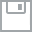
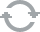
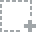
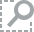
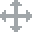
...
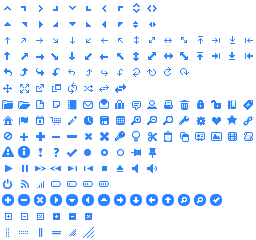
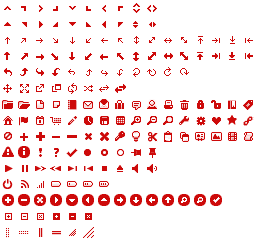
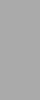
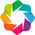
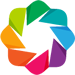

In [5]:
import pandas as pd
from bokeh.plotting import figure, vplot, output_notebook, show
from bokeh.models import (HoverTool, LinearAxis, Range1d, GlyphRenderer)
output_notebook()

In [6]:
# Bokeh options for interaction
TOOLS="pan,box_zoom,reset,resize,save,hover"

# Read in example log file
log_data = pd.read_csv('log_file.csv', index_col=0)
time_x = log_data.iloc[ : , 1]
T_data = log_data.iloc[ : , 2]
HF_data = log_data.iloc[ : , 3]

# Format plots and display data
p1 = figure(title='FF Helmet - Ambient Temp', x_axis_label = 'Time (s)', y_axis_label = 'Temperature (°C)', 
            tools=TOOLS, plot_width=750, plot_height=500)
p1.line(time_x, T_data, color='red', line_width = 3, legend='Amb T')

p2 = figure(title='FF Helmet - Heat Flux', x_axis_label = 'Time (s)', y_axis_label = 'Heat Flux (kW/m²)', 
            tools=TOOLS, plot_width=750, plot_height=500)
p2.line(time_x, HF_data, color='blue', line_width = 3, line_dash = 'dashed', legend='Heat Flux')

p = vplot(p1, p2)

In [7]:
show(p)

Data from an example file were plotted here. The code used to plot the helmet sensor data in real time incorporates a while loop to read the log file and update the data on the Bokeh server (and thus the plots) every second:

    # Assign data source to use when rendering glyphs to update data
    renderer = p1.select(dict(type=GlyphRenderer))
    ds1 = renderer[0].data_source

    renderer = p2.select(dict(type=GlyphRenderer))
    ds2 = renderer[0].data_source

    while True:
        # Update plots with data
        ds1.data["x"] = time_x
        ds1.data["y"] = T_data
        ds1._dirty = True
        cursession().store_objects(ds1)

        ds2.data["x"] = time_x
        ds2.data["y"] = HF_data
        ds2._dirty = True
        cursession().store_objects(ds2)

        time.sleep(1)
        
        # read log file
        new_data = pd.read_csv('../Data/log_file.csv', index_col=0)
        time_x = new_data.iloc[ : , 1]
        T_data = new_data.iloc[ : , 2]
        HF_data = new_data.iloc[ : , 3]

A video (2X speed) showing the real-time data plotting in action is presented below.

In [23]:
import io
import base64
from IPython.display import HTML

video = io.open('media/realtime_plotting.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

By implementing basic Python code using Bokeh and other tools, data from a firefighter's immediate environment in fire scenarios are now able to be transmitted and plotted in real-time.

# References
1. Willi J, Horn G, Madrzykowski D (2015) Characterizing a Firefighter's Immediate Thermal Environment in Live-Fire Training Scenarios. Fire Technology. *In Press*